# Figure S3

In [1]:
import spatialdata
import spatialdata_plot
import scportrait
import scanpy as sc
import anndata as ad

import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import numpy as np
import pandas as pd

# define plotting parameters for consistency across figures and vector graphic export
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.size'] = 10
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = 'Helvetica'

# define custom colormaps
color_list_red = [ '#FFFFFF','#B3262A']
custom_cmap_red = mpl.colors.LinearSegmentedColormap.from_list('custom_gradient', color_list_red)

color_list_blue = ['#FFFFFF','#2F559A']
custom_cmap_blue = mpl.colors.LinearSegmentedColormap.from_list('custom_gradient', color_list_blue)

/Users/sophia/mambaforge/envs/scportrait/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/sophia/mambaforge/envs/scportrait/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
figures_directory = "../manuscript_figures/Figure_S3/"
sdata_path = "../figure_data/input_data_CODEX/scportrait_project_codex_region1/scportrait.sdata"
h5sc_path = "../figure_data/input_data_CODEX/scportrait_project_codex_region1/extraction/data/single_cells.h5sc"
px_resolution = 0.5085184
os.makedirs(figures_directory, exist_ok=True)

In [3]:
# load required input data
sdata = spatialdata.read_zarr(sdata_path)
h5sc = scportrait.io.read_h5sc(h5sc_path)

In [4]:
# select a smaller region for additional visualization
max_width = 800
center_x = 1500
center_y = 1000

select_sdata = scportrait.tl.sdata.processing.get_bounding_box_sdata(sdata, center_x = center_x, center_y = center_y, max_width = max_width)

## Fig S3a: CODEX tissue overview

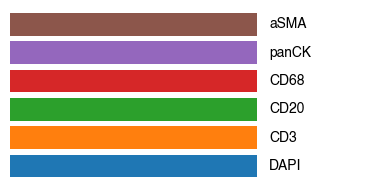

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [5]:
# Select channels for visualization
	# 1.	CD3 – T cells
	# 2.	CD20 – B cells
	# 3.	CD68 – Myeloid/macrophages
	# 4.	panCK – Epithelial cells
	# 5.	aSMA – Stromal/fibroblasts
	# 6.	DAPI – Nuclear counterstain

channels = ['DAPI', 'CD3', 'CD20', 'CD68', 'panCK', 'aSMA',]
colors = ['#1f77b4ff', '#ff7f0eff', '#2ca02cff', '#d62728ff', '#9467bdff', '#8c564bff',]

# Create the legend
fig, ax = plt.subplots(figsize=(4, 2))
for i, (label, color) in enumerate(zip(channels, colors)):
    ax.barh(i, 1, color=color)
    ax.text(1.05, i, label, va='center')

ax.set_xlim(0, 1.5)
ax.set_ylim(-0.5, len(channels) - 0.5)
ax.axis('off')
plt.tight_layout()
plt.show()

fig.savefig(f"{figures_directory}/CODEX_tissue_overview_colorbar_legend.pdf", bbox_inches='tight')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.4798462129950019].
/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/ipykernel_59918/2426772727.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


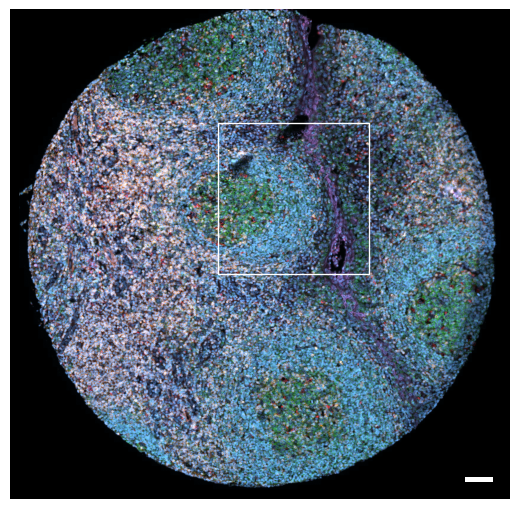

In [6]:
fig, axs = scportrait.pl.sdata._create_figure_dpi(1500, 1500, dpi = 300)
norm = mpl.colors.Normalize(np.uint16(0), np.iinfo(np.uint16).max, clip = False) 

scportrait.pl.sdata.plot_image(sdata, 
                                "input_image", 
                                channel_names= channels, 
                                palette = colors,
                                norm = norm,
                                ax = axs, 
                                show_fig=False)
axs.axis("off")
axs.set_title(None)

# add rectangle indicating where the selected region is located
bb_xmin = center_x - max_width // 2
bb_ymin = center_y - max_width // 2
bb_w, bb_h = max_width, max_width
rect = mpl.patches.Rectangle((bb_xmin, bb_ymin), bb_w, bb_h, linewidth=1, edgecolor="white", facecolor="none")
axs.add_patch(rect)

# add scalebar using the defined px resolution
scportrait.pl.add_scalebar(ax=axs, 
                           resolution = px_resolution, 
                           fixed_length = 75, 
                           scale_loc = "none", 
                           border_pad = 1)

fig.tight_layout()
fig.savefig(f"{figures_directory}/CODEX_tissue_overview.pdf", bbox_inches = "tight")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1215686274509804].


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


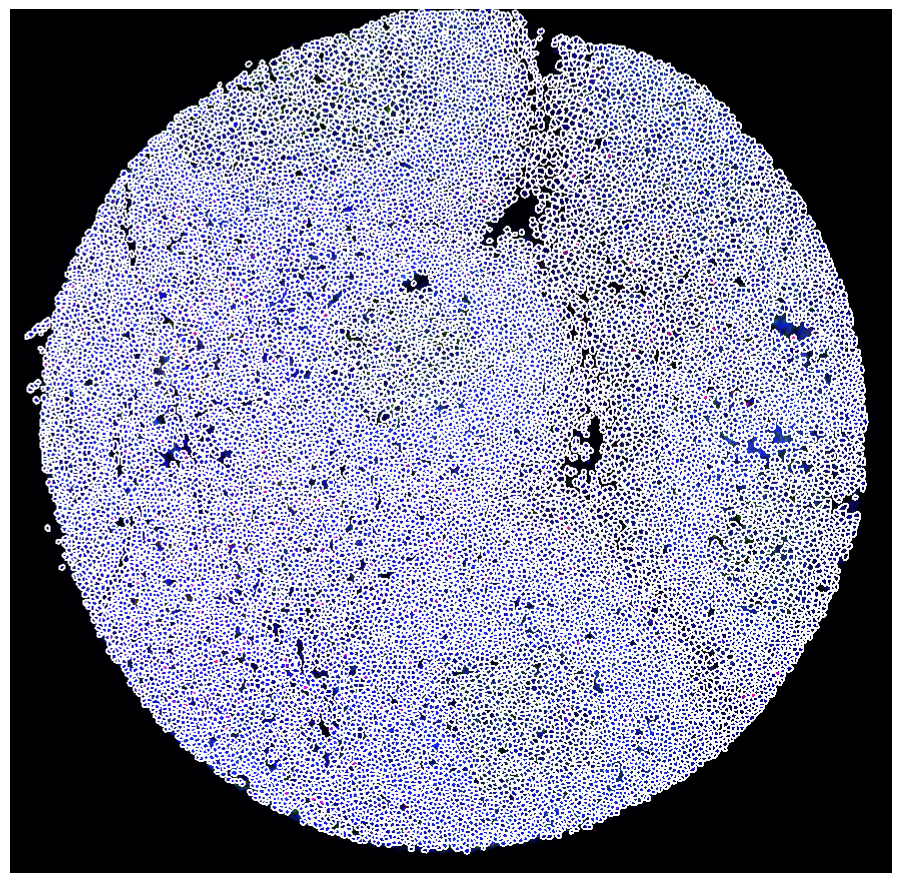

In [7]:
scportrait.pl.sdata.plot_segmentation_mask(sdata, masks = ["seg_all_nucleus"])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0023836985774702037..1.5038216070742023].


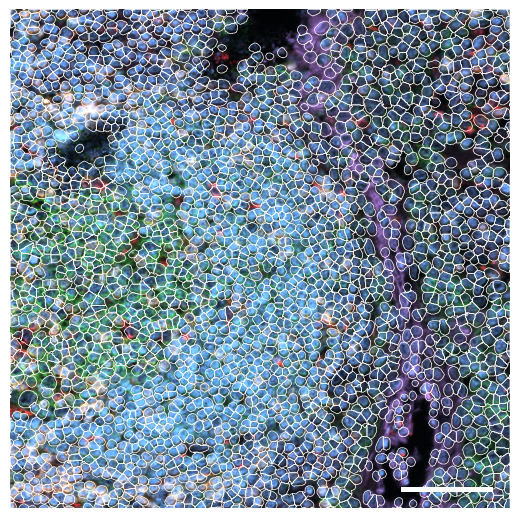

In [8]:
fig, axs = scportrait.pl.sdata._create_figure_dpi(1500, 1500, dpi = 300)
norm = mpl.colors.Normalize(np.uint16(0), np.iinfo(np.uint16).max, clip = False)

scportrait.pl.sdata.plot_image(select_sdata, 
                                   "input_image", 
                                   channel_names= channels, 
                                   palette = colors,
                                   norm = norm,
                                   ax = axs, 
                                   show_fig=False)
scportrait.pl.add_scalebar(ax=axs, 
                           resolution = px_resolution, 
                           scale_loc = "none", 
                           fixed_length=75,
                           border_pad = 1)
scportrait.pl.sdata.plot_segmentation_mask(select_sdata, ["seg_all_nucleus"], background_image=None, ax = axs, line_width=0.5)

axs.axis("off")
axs.set_title(None)
fig.savefig(f"{figures_directory}/CODEX_tissue_overview_selected_region_with_segmentation_masks.pdf", bbox_inches = "tight")

## Fig S3b: select CODEX channels in a small area of the tissue sample

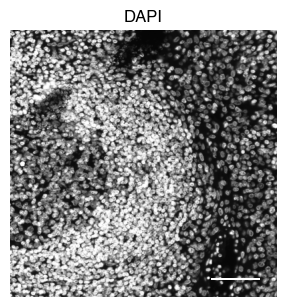

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


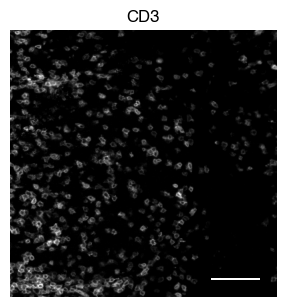

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


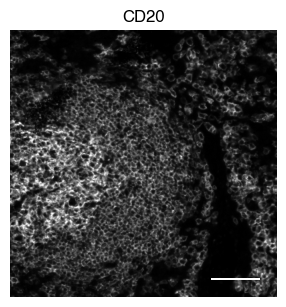

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


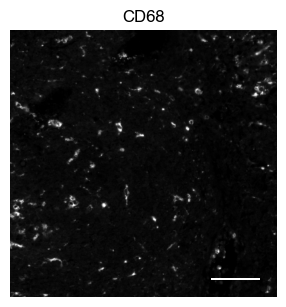

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


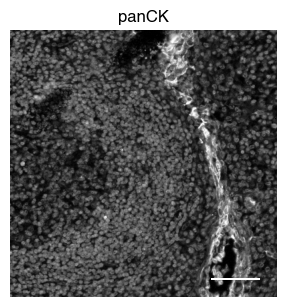

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


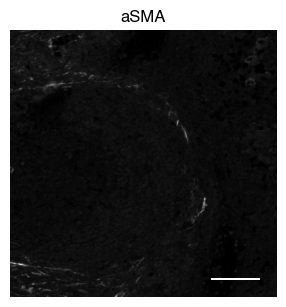

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [9]:
# plot close up view of selected channels as individual images
_, x, y = select_sdata["input_image"].scale0.image.shape

for i in channels:
    fig, axs = scportrait.pl.sdata._create_figure_dpi(x, y, dpi = 300)
    norm = mpl.colors.Normalize(np.uint16(0), np.iinfo(np.uint16).max, clip = False)
    scportrait.pl.sdata.plot_image(select_sdata, 
                                   "input_image", 
                                   channel_names= i, 
                                   cmap = "Grays_r", 
                                   norm = norm, 
                                   ax = axs, 
                                   show_fig=False)
    scportrait.pl.add_scalebar(ax=axs, resolution = px_resolution, scale_loc = "none", border_pad = 1)
    
    axs.axis("off")
    axs.set_title(i)
    
    plt.show()
    fig.savefig(f"{figures_directory}/CODEX_channel_overview_selected_region_channel_{i}.pdf", bbox_inches='tight')


##  Fig S3c: single-cell images across all CODEX channels

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


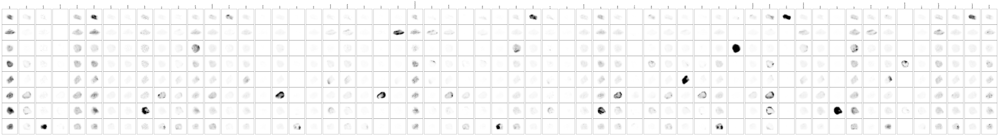

In [10]:
# excluded cells region1 for channels that alreadyhave other positive cells: 18327,1437,6367, 18857, 6941,
cell_ids = [4586, 4780, 8339, 10024, 10256, 11773, 11993, 16379]

fig = scportrait.pl.h5sc.cell_grid_multi_channel(h5sc, 
                                                 cell_ids = cell_ids, 
                                                 cmap = "Grays",
                                                 select_channels=h5sc.var["channels"][1:],
                                                 label_channels = True,
                                                 channel_label_rotation=90,
                                                 show_cell_id=False,
                                                 return_fig=True)
fig.tight_layout()
fig.savefig(f"{figures_directory}/CODEX_single_cell_images_with_labels.pdf", bbox_inches = "tight")

## Fig S3d: OT/Flow Matching illustration 

illustrative sketch, no data shown

##  Fig S3e: marker gene expression inferred by flow matching per OT assigned cell type

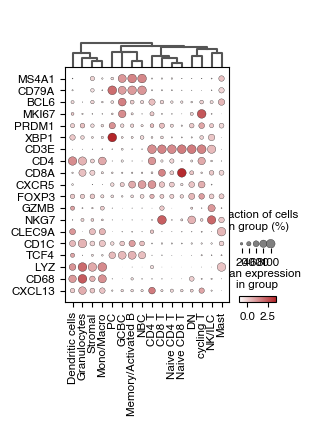

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [11]:
gene_expression_markers = [
    "MS4A1", "CD79A", "BCL6", "MKI67", "PRDM1",
    "XBP1", "CD3E", "CD4", "CD8A", "CXCR5",
    "FOXP3", "GZMB", "NKG7", "CLEC9A", "CD1C",
    "TCF4", "LYZ", "CD68", "CXCL13",
]

# get anndata object from spatialdata containing the complete gene expression data generated through flowmatching
adata = sdata['complete_gene_expression'].copy()
sc.pp.scale(adata)
sc.pp.pca(adata)
sc.tl.dendrogram(adata, groupby="simplified_cell_type")

fig, axs = plt.subplots(1, 1, figsize = (2.5*1.09, 3.8))
dp = sc.pl.dotplot(adata, 
                    var_names = gene_expression_markers, 
                    groupby="simplified_cell_type", 
                    cmap = custom_cmap_red,
                    dendrogram=True,
                    swap_axes=True,
                    return_fig=True,
                    ax = axs)

dp.style(largest_dot=40)
dp.show()
fig.tight_layout()
fig.savefig(f"{figures_directory}/OTcelltypes_gene_expression_dotplot.pdf", dpi = 900,)

##  Figure S3f: comparision of gene expression space measured using CITEseq vs inferred by flow matching

In [12]:
# read original CITEseq data
adata_CITE = ad.read_h5ad("../figure_data/input_data_CODEX/CITEseq_rna_processed_full_genome.h5ad")

# get CODEX gene expression data
adata_CODEX_gex = sdata["complete_gene_expression"].copy()

#annotate datasource
adata_CITE.obs["dataset"] = "measured"
adata_CODEX_gex.obs["dataset"] = "predicted tonsilitis"

#generate one dataset containing all
adata = ad.concat([adata_CITE, adata_CODEX_gex])

In [13]:
 #generate a joint UMAP embedding
sc.pp.scale(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/sophia/mambaforge/envs/scportrait/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


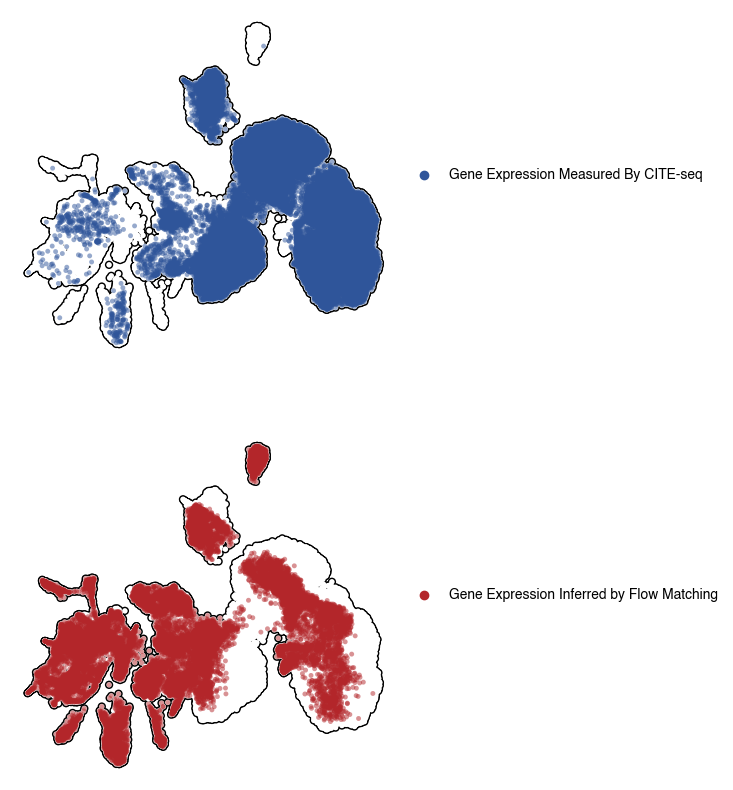

In [14]:
fig, axs = plt.subplots(2, 1, figsize = (5, 10))
sc.pl.umap(adata, 
           color = ["dataset"], 
           palette = ['#2F559A',  '#B3262A'],
           frameon=False, 
           add_outline = True,
           alpha = 0.5,
           size=50,
           groups=['measured'],
           ax = axs[0],
           na_color = "white",
           legend_loc = "upper right",
           title = "",
           show = False
           )

axs[0].set_title(None)
axs[0].set_rasterized(True)
handles0, labels0 = axs[0].get_legend_handles_labels()
axs[0].legend(
    handles=handles0,
    labels=["Gene Expression Measured By CITE-seq", ""],
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    frameon=False
)

sc.pl.umap(adata, 
           color = ["dataset"], 
           palette = ['#2F559A',  '#B3262A'],
           frameon=False, 
           size=50,
           alpha = 0.5,
           groups=['predicted tonsilitis'],
           ax = axs[1],
           na_color = "white",
           add_outline = True,
           legend_loc = "upper right",
           title = "",
           show = False
           )
axs[1].set_title(None)
axs[1].set_rasterized(True)

# Remove legend frame and update legend labels for axs[1]
handles1, labels1 = axs[1].get_legend_handles_labels()
axs[1].legend(
    handles=handles1,
    labels=["Gene Expression Inferred by Flow Matching", ""],
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    frameon=False
)

plt.show()
fig.savefig(f"{figures_directory}/measured_vs_flow_matched_GEX.pdf", dpi = 900)




## Figure S3g: CD21 expression with Germinal Center (GC) regions highlighted

INFO     Rasterizing image for faster rendering.                                                                   


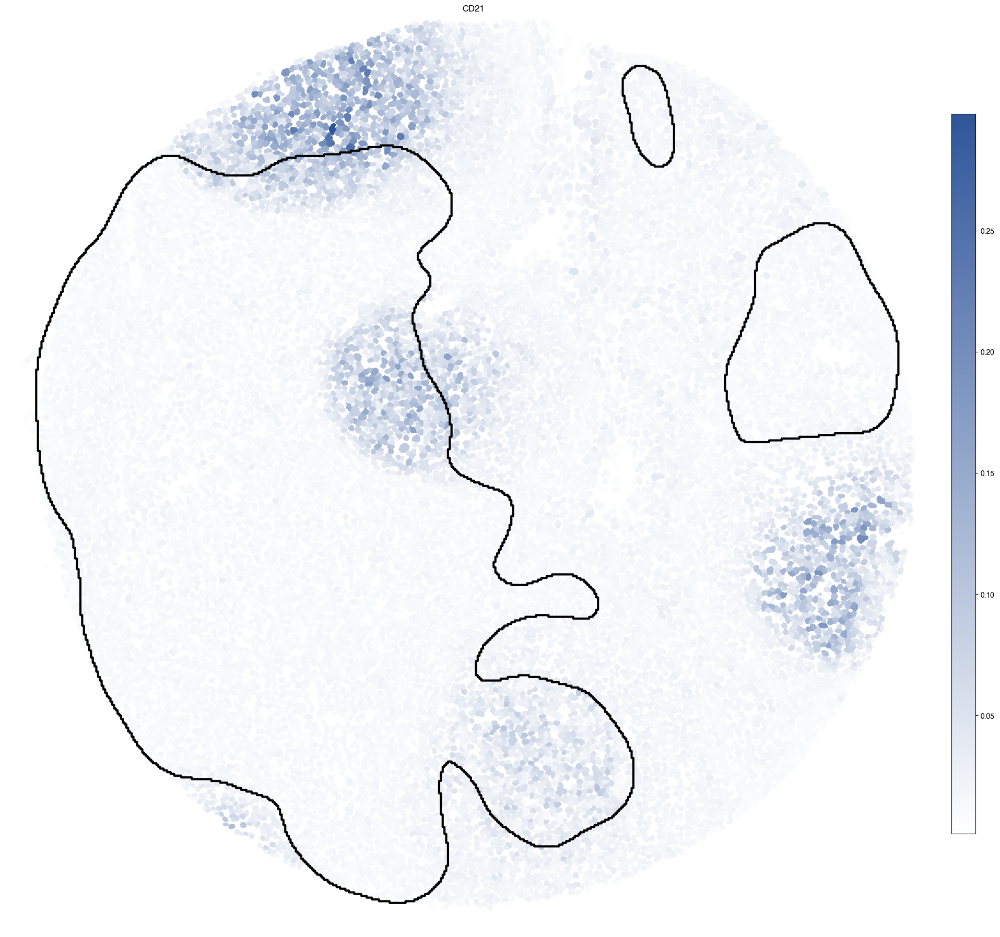

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [15]:
genes = ["CD21_mean_nucleus"]

fig, ax = plt.subplots(1, len(genes), figsize = (20*len(genes), 20))

for i, gene in enumerate(genes):
    scportrait.pl.sdata.plot_labels(sdata, 
                                    label_layer="seg_all_nucleus",
                                    color = "CD21_mean_nucleus",
                                    cmap = custom_cmap_blue,
                                    ax= ax,
                                    show_fig=False)
    scportrait.pl.sdata.plot_segmentation_mask(sdata, 
                                            masks = ["Tcell_rich_regions"], 
                                            background_image=None,
                                            line_color="black",
                                            show_fig=False,
                                            line_width = 3,
                                            ax = ax)
    ax.set_title("CD21")
# resize colorbars 
fig.tight_layout()
for cb in fig.axes:
    if cb.get_label().startswith("<colorbar>"):
        box = cb.get_position()
        f = 0.7  # keep 75% of original height
        h_new = box.height * f
        dy = (box.height - h_new) / 2
        cb.set_position([box.x0, box.y0 + dy, box.width, h_new])


plt.show()

fig.savefig(f"{figures_directory}/Tcell_rich_regions_spatial_CODEX_marker_expression_CD21.pdf")

## Figure S3h: inferred TCL1A expression with Germinal Center (GC) regions highlighted

INFO     Rasterizing image for faster rendering.                                                                   


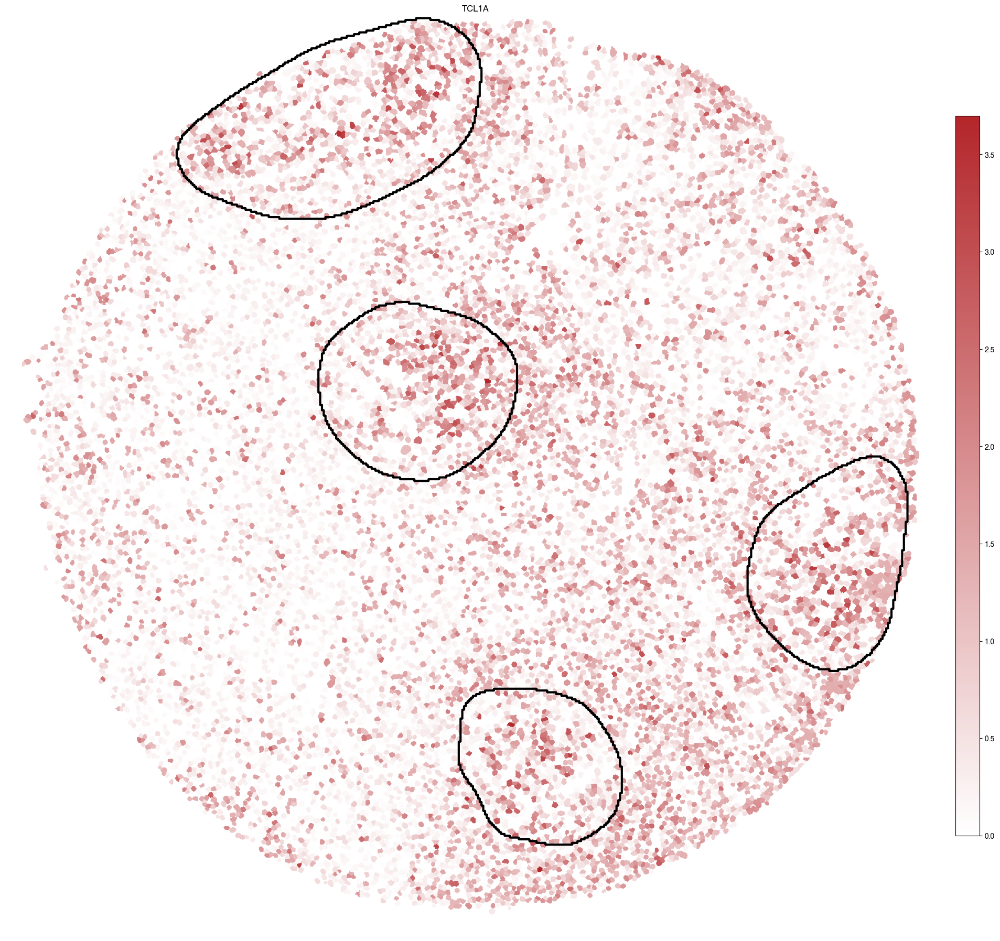

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [16]:
genes = ["TCL1A"]

fig, ax = plt.subplots(1, len(genes), figsize = (20*len(genes), 20))

for i, gene in enumerate(genes):
    scportrait.pl.sdata.plot_labels(sdata, 
                                    label_layer="seg_all_nucleus",
                                    color = gene,
                                    cmap = custom_cmap_red,
                                    ax= ax,
                                    show_fig=False)
    scportrait.pl.sdata.plot_segmentation_mask(sdata, 
                                            masks = ["GC_regions"], 
                                            background_image=None,
                                            line_color="black",
                                            show_fig=False,
                                            line_width=3,
                                            ax = ax)
    ax.set_title(gene)
# resize colorbars 
fig.tight_layout()

for cb in fig.axes:
    if cb.get_label().startswith("<colorbar>"):
        box = cb.get_position()
        f = 0.7  # keep 75% of original height
        h_new = box.height * f
        dy = (box.height - h_new) / 2
        cb.set_position([box.x0, box.y0 + dy, box.width, h_new])


plt.show()
fig.savefig(f"{figures_directory}/GC_regions_spatial_gene_expression_{gene}.pdf")

## Figure S3i: CD3 expression with T-cell rich regions highlighted

INFO     Rasterizing image for faster rendering.                                                                   


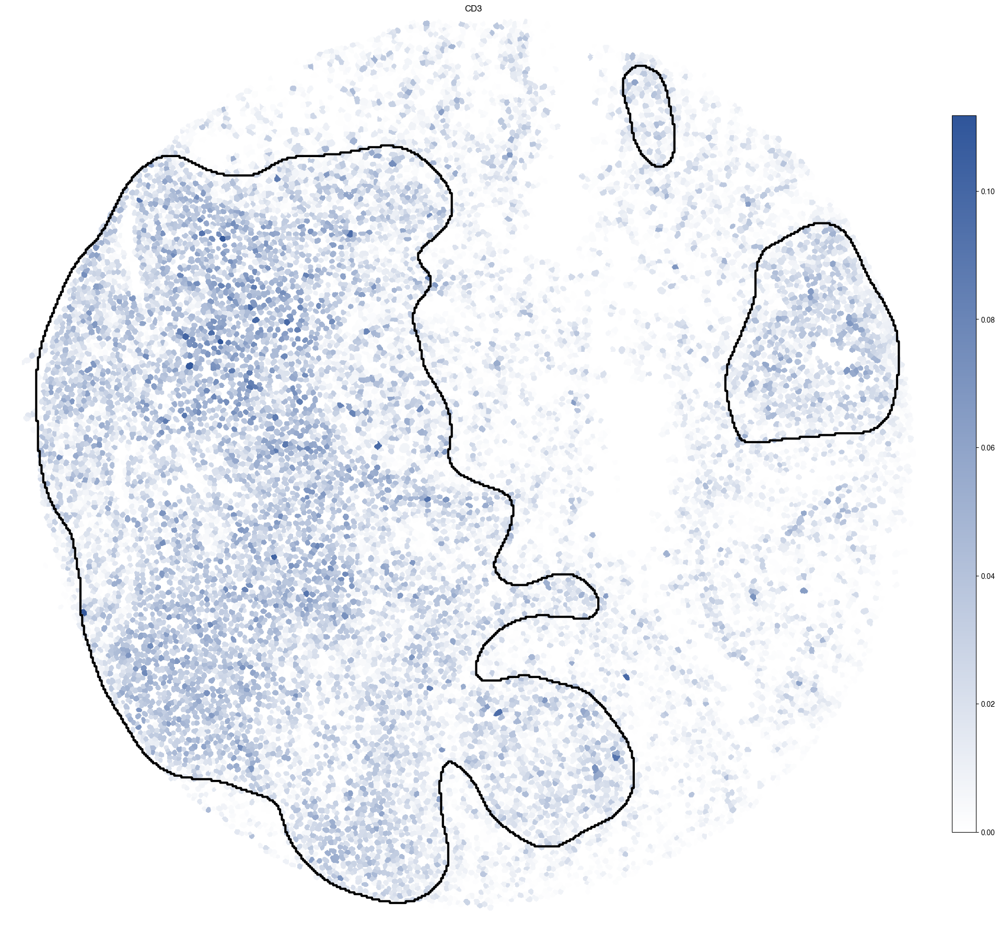

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [17]:
genes = ["CD3_mean_nucleus"]

fig, ax = plt.subplots(1, len(genes), figsize = (20*len(genes), 20))

for i, gene in enumerate(genes):
    scportrait.pl.sdata.plot_labels(sdata, 
                                    label_layer="seg_all_nucleus",
                                    color = "CD3_mean_nucleus",
                                    cmap = custom_cmap_blue,
                                    ax= ax,
                                    show_fig=False)
    scportrait.pl.sdata.plot_segmentation_mask(sdata, 
                                            masks = ["Tcell_rich_regions"], 
                                            background_image=None,
                                            line_color="black",
                                            show_fig=False,
                                            line_width = 3,
                                            ax = ax)
    ax.set_title("CD3")
# resize colorbars 
fig.tight_layout()
for cb in fig.axes:
    if cb.get_label().startswith("<colorbar>"):
        box = cb.get_position()
        f = 0.7  # keep 75% of original height
        h_new = box.height * f
        dy = (box.height - h_new) / 2
        cb.set_position([box.x0, box.y0 + dy, box.width, h_new])


plt.show()

fig.savefig(f"{figures_directory}/Tcell_rich_regions_spatial_CODEX_marker_expression_CD3.pdf")

## Figure S3j: inferrred CD2 expression with T-cell rich regions highlighted

INFO     Rasterizing image for faster rendering.                                                                   


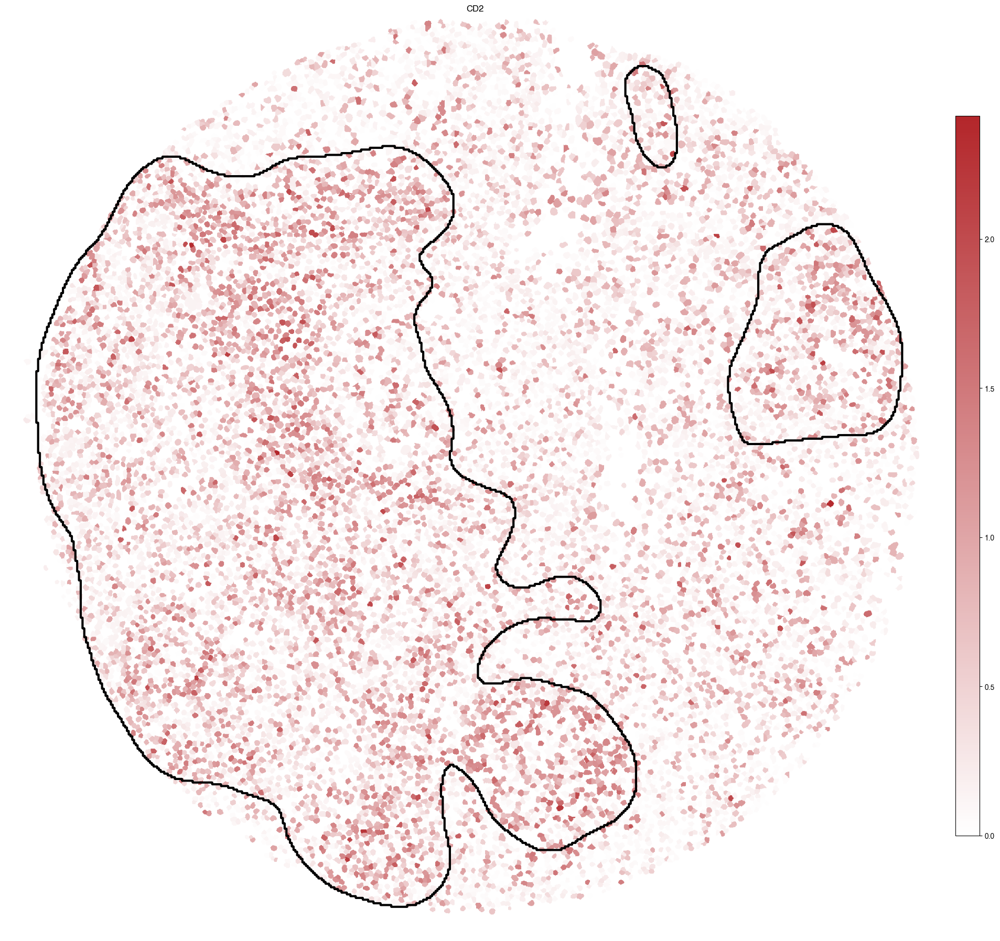

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


In [18]:
genes = ["CD2"]

fig, ax = plt.subplots(1, len(genes), figsize = (20*len(genes), 20))

for i, gene in enumerate(genes):
    scportrait.pl.sdata.plot_labels(sdata, 
                                    label_layer="seg_all_nucleus",
                                    color = gene,
                                    cmap = custom_cmap_red,
                                    ax= ax,
                                    show_fig=False)
    scportrait.pl.sdata.plot_segmentation_mask(sdata, 
                                            masks = ["Tcell_rich_regions"], 
                                            background_image=None,
                                            line_color="black",
                                            show_fig=False,
                                            line_width=3,
                                            ax = ax)
    ax.set_title(gene)
# resize colorbars 
fig.tight_layout()

for cb in fig.axes:
    if cb.get_label().startswith("<colorbar>"):
        box = cb.get_position()
        f = 0.7  # keep 75% of original height
        h_new = box.height * f
        dy = (box.height - h_new) / 2
        cb.set_position([box.x0, box.y0 + dy, box.width, h_new])


plt.show()
fig.savefig(f"{figures_directory}/Tcell_rich_regions_spatial_gene_expression_CD2.pdf")

### Statistical testing for plots g,h,i.j

In [19]:
from spatialdata import polygon_query
from shapely import MultiPolygon, Polygon
from scipy.stats import ttest_ind, mannwhitneyu
from statsmodels.stats.multitest import multipletests

In [20]:
_, x, y = sdata["input_image"].scale0.image.shape

# GC region
polygon_bcell = MultiPolygon(sdata['GC_regions_vectorized'].geometry.values)
inverse_polygon_bcell = Polygon([[0, 0], [0, y], [x, y], [x, 0]]).difference(polygon_bcell)

selection_areas_bcells = [polygon_bcell, inverse_polygon_bcell]

genes = ["TCL1A","BCL6", "ICOS", "MS4A1", "CR2", "ACTB"]
gene_expression = {}
polygon_annotation = ["within_bcell", "outside_bcell"]
for i, _polygon in enumerate(selection_areas_bcells):
    cropped_sdata_region1 = polygon_query(
                            sdata,
                            polygon=_polygon,
                            target_coordinate_system="global"
                        )
    region_cell_ids = set(cropped_sdata_region1['seg_all_nucleus_vectorized'].label.tolist())

    if polygon_annotation[i] not in gene_expression:
        gene_expression[polygon_annotation[i]] = {}
    
    for gene in genes:
        gene_expression[polygon_annotation[i]][gene] = np.array(cropped_sdata_region1['complete_gene_expression'][[x in region_cell_ids for x in cropped_sdata_region1['complete_gene_expression'].obs.scportrait_cell_id.tolist()], gene].X.ravel())

# build long dataframe
records = []
for dataset_label, genes in gene_expression.items():
    for gene, arr in genes.items():
        records.extend([{"gene": gene, "value": v, "label": dataset_label} for v in arr])

df_GC_region = pd.DataFrame(records)
results = []

for gene in df_GC_region["gene"].unique():
    vals_within = df_GC_region.loc[(df_GC_region["gene"] == gene) & (["within" in x for x in df_GC_region["label"]]), "value"].values
    vals_outside = df_GC_region.loc[(df_GC_region["gene"] == gene) & (["outside" in x for x in df_GC_region["label"]]), "value"].values

    # drop NaNs
    vals_within = vals_within[~np.isnan(vals_within)]
    vals_outside = vals_outside[~np.isnan(vals_outside)]

    # Welch t-test
    t_stat, t_pval = ttest_ind(vals_within, vals_outside, equal_var=False)

    # Mann–Whitney
    u_stat, u_pval = mannwhitneyu(vals_within, vals_outside, alternative="two-sided")

    results.append({
        "gene": gene,
        "mean_within": np.mean(vals_within),
        "mean_outside": np.mean(vals_outside),
        "t_stat": t_stat,
        "t_pval": t_pval,
        "u_stat": u_stat,
        "u_pval": u_pval,
        "region":"GC_region"
    })

results_df = pd.DataFrame(results)



/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/ipykernel_59918/2119536496.py:36: FutureWarning: Logical ops (and, or, xor) between Pandas objects and dtype-less sequences (e.g. list, tuple) are deprecated and will raise in a future version. Wrap the object in a Series, Index, or np.array before operating instead.
  vals_within = df_GC_region.loc[(df_GC_region["gene"] == gene) & (["within" in x for x in df_GC_region["label"]]), "value"].values
/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/ipykernel_59918/2119536496.py:37: FutureWarning: Logical ops (and, or, xor) between Pandas objects and dtype-less sequences (e.g. list, tuple) are deprecated and will raise in a future version. Wrap the object in a Series, Index, or np.array before operating instead.
  vals_outside = df_GC_region.loc[(df_GC_region["gene"] == gene) & (["outside" in x for x in df_GC_region["label"]]), "value"].values


In [21]:
# Tcell rich region
polygon_tcell = MultiPolygon(sdata['Tcell_rich_regions_vectorized'].geometry.values)
inverse_polygon_tcell = Polygon([[0, 0], [0, y], [x, y], [x, 0]]).difference(polygon_tcell)

selection_areas_tcells = [polygon_tcell, inverse_polygon_tcell]
polygon_annotation = ["within", "outside"]

genes = ["CD2", "CD3G"]
polygon_annotation = ["within_tcell", "outside_tcell"]
gene_expression = {}
for i, _polygon in enumerate(selection_areas_tcells):
    cropped_sdata_region1 = polygon_query(
                            sdata,
                            polygon=_polygon,
                            target_coordinate_system="global"
                        )
    region_cell_ids = set(cropped_sdata_region1['seg_all_nucleus_vectorized'].label.tolist())

    if polygon_annotation[i] not in gene_expression:
        gene_expression[polygon_annotation[i]] = {}
    
    for gene in genes:
        gene_expression[polygon_annotation[i]][gene] = np.array(cropped_sdata_region1['complete_gene_expression'][[x in region_cell_ids for x in cropped_sdata_region1['complete_gene_expression'].obs.scportrait_cell_id.tolist()], gene].X.ravel())

# build long dataframe
records = []
for dataset_label, genes in gene_expression.items():
    for gene, arr in genes.items():
        records.extend([{"gene": gene, "value": v, "label": dataset_label} for v in arr])

df_Tcell_region = pd.DataFrame(records)

for gene in df_Tcell_region["gene"].unique():
    vals_within = df_Tcell_region.loc[(df_Tcell_region["gene"] == gene) & (["within" in x for x in df_Tcell_region["label"]]), "value"].values
    vals_outside = df_Tcell_region.loc[(df_Tcell_region["gene"] == gene) & (["outside" in x for x in df_Tcell_region["label"]]), "value"].values

    # drop NaNs
    vals_within = vals_within[~np.isnan(vals_within)]
    vals_outside = vals_outside[~np.isnan(vals_outside)]

    # Welch t-test
    t_stat, t_pval = ttest_ind(vals_within, vals_outside, equal_var=False)

    # Mann–Whitney
    u_stat, u_pval = mannwhitneyu(vals_within, vals_outside, alternative="two-sided")

    results.append({
        "gene": gene,
        "mean_within": np.mean(vals_within),
        "mean_outside": np.mean(vals_outside),
        "t_stat": t_stat,
        "t_pval": t_pval,
        "u_stat": u_stat,
        "u_pval": u_pval,
        "region":"TCell_rich_region"
    })


/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/ipykernel_59918/42339967.py:34: FutureWarning: Logical ops (and, or, xor) between Pandas objects and dtype-less sequences (e.g. list, tuple) are deprecated and will raise in a future version. Wrap the object in a Series, Index, or np.array before operating instead.
  vals_within = df_Tcell_region.loc[(df_Tcell_region["gene"] == gene) & (["within" in x for x in df_Tcell_region["label"]]), "value"].values
/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/ipykernel_59918/42339967.py:35: FutureWarning: Logical ops (and, or, xor) between Pandas objects and dtype-less sequences (e.g. list, tuple) are deprecated and will raise in a future version. Wrap the object in a Series, Index, or np.array before operating instead.
  vals_outside = df_Tcell_region.loc[(df_Tcell_region["gene"] == gene) & (["outside" in x for x in df_Tcell_region["label"]]), "value"].values


In [22]:
results_df = pd.DataFrame(results)

# raw significance on Welch p-values
results_df["sig_ttest"] = results_df["t_pval"] < 0.05

# optional multiple testing correction (FDR Benjamini–Hochberg)
_, qvals_t, _, _ = multipletests(results_df["t_pval"], method="fdr_bh")
results_df["qval_ttest"] = qvals_t
results_df["sig_ttest_FDR"] = results_df["qval_ttest"] < 0.05

# Bonferroni family-wise correction
rej, p_bonf, _, _ = multipletests(results_df["t_pval"], alpha=0.05, method="bonferroni")
results_df["p_bonf"] = p_bonf
results_df["sig_ttest_bonf"] = rej

# raw significance on Mann–Whitney p-values
results_df["sig_mw"] = results_df["u_pval"] < 0.05

# Benjamini–Hochberg (FDR) for Mann–Whitney
_, qvals_u, _, _ = multipletests(results_df["u_pval"], method="fdr_bh")
results_df["qval_mw"] = qvals_u
results_df["sig_mw_FDR"] = results_df["qval_mw"] < 0.05

# Bonferroni for Mann–Whitney
rej_u, p_bonf_u, _, _ = multipletests(results_df["u_pval"], alpha=0.05, method="bonferroni")
results_df["p_bonf_mw"] = p_bonf_u
results_df["sig_mw_bonf"] = rej_u

results_df.to_csv(f"{figures_directory}/CODEX_regions_gene_expression_statistics_pvalues.csv", index = False)

## Figure S3k: OT assigned cell types visualized in spatial context across tissue section

/Users/sophia/mambaforge/envs/scportrait/lib/python3.11/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `seg_all_nucleus_vectorized` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/sophia/mambaforge/envs/scportrait/lib/python3.11/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `_annotation` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/Users/sophia/Documents/GitHub/spatialdata-plot/src/spatialdata_plot/pl/utils.py:798: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/ipykernel_59918/3832433637.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


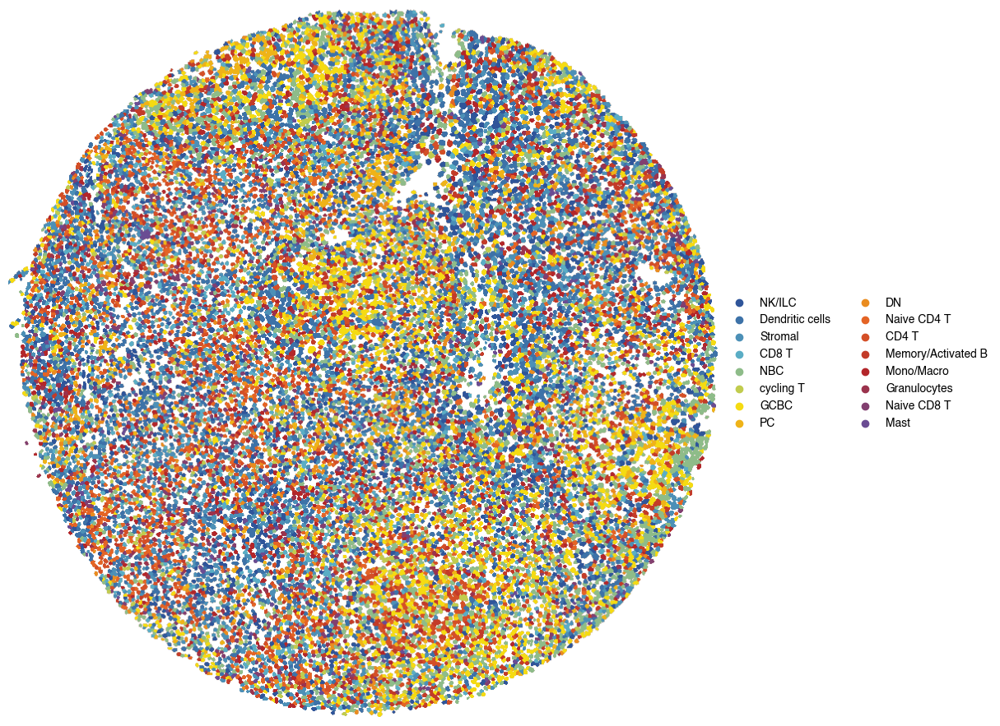

In [23]:
# Create a continuous colormap from our defined colors
color_list = ['#2F559A', '#5AADC5', '#F5DB12', '#E46425', '#B3262A', '#6A4C93']
custom_cmap = mpl.colors.LinearSegmentedColormap.from_list('custom_gradient', color_list)

def generate_palette(n_colors, custom_cmap):
    palette = [custom_cmap(i / (n_colors - 1)) for i in range(n_colors)]

    # convert to hex colors 
    palette = [mpl.colors.to_hex(x) for x in palette]
    return(palette)

groups = list(sdata['complete_gene_expression'].obs["simplified_cell_type"].unique())
sorted(groups)

fig = scportrait.pl.sdata.plot_labels(sdata, 
                                      palette = generate_palette(len(groups), custom_cmap),
                                      groups = groups,
                                      label_layer="seg_all_nucleus",
                                      color = "simplified_cell_type", 
                                      return_fig = True, 
                                      vectorized = True)
fig.tight_layout()
fig.savefig(f"{figures_directory}/CODEX_tissue_overview_OT_annotated_simplified_celltypes.pdf", bbox_inches = "tight")